<a href="https://colab.research.google.com/github/lauralpezb/Charla_PyCon/blob/main/crea_tu_audio_y_descubre_su_magia_con_Python.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Crea tu propio audio y descubre su magia con Python**

## **Alguna vez te preguntaste: ¿A qué suena una Sinusoidal?**

Importar librerías

In [ ]:
import warnings 
warnings.filterwarnings('ignore')

# Reproducir audio
import IPython.display as ipd 

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
# Crear una sinusoidal

# Definir variables:
sr = 22050 # Frecuencia de Muestreo
T = 1    # segundos de reproducción
t = np.linspace(0, T, int(T*sr), endpoint=False) # Variable de tiempo

x1 = 0.5*np.sin(2*np.pi*440*t)         # Sinusoidal pura a 440 Hz 

ipd.Audio(x1, rate=sr) # Escuchar el array

In [ ]:
# Crear una sinusoidal a 5Hz
x2 = 0.5*np.sin(2*np.pi*5*t)

ipd.Audio(x2, rate=sr) # Escuchar el array

In [ ]:
# Crear una sinusoidal a 1000Hz
x3 = 0.5*np.sin(2*np.pi*1000*t)

ipd.Audio(x3, rate=sr) # Escuchar el array

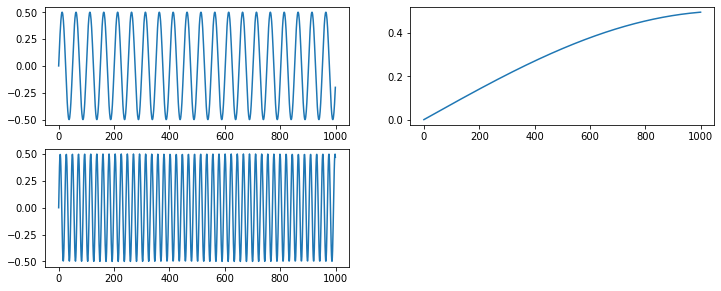

In [ ]:
plt.figure(figsize=(12,10))
for n in range(3):
    plt.subplot(4,2,n+1)
    plt.plot(eval('x'+str(n+1))[:1000])

## **Leamos un archivo WAV**

Puedes probar con otros sonidos: https://sound-effects.bbcrewind.co.uk/

Librería wavfile

Más información en https://docs.python.org/es/3/library/wave.html

In [ ]:
#Importar librería
from scipy.io import wavfile 

# Ubcación del archivo
AudioName = "/content/07070175.wav" 

# Obtener fs (Frecuencia de muestreo) y Audiodata (Señal de audio)
fs, Audiodata = wavfile.read(AudioName)

# Imprimir características
print(f'Duración = {Audiodata.shape[0]/fs} , Frecuencia de Muestreo = {fs} [=] Muestras/Seg , Wav format = {Audiodata.dtype}')

# Reproducir audio
ipd.Audio(AudioName)

Duración = 37.413333333333334 , Frecuencia de Muestreo = 44100 [=] Muestras/Seg , Wav format = int16


Librería Librosa

Más información en https://librosa.org/doc/latest/tutorial.html

In [ ]:
# importar a librería
import librosa 

# Obtener x (señal de audio) y sr (frecuencia de muestreo)
x, sr = librosa.load('/content/07070175.wav', sr=None) #Si no se especifica sr=None, entonces el audio se cambia de sampling a 22050

# Imprimir características 
print(f'Tamaño del archivo de audio = {x.shape}, Frecuencia de Muestreo = {sr}')

Tamaño del archivo de audio = (1649928,), Frecuencia de Muestreo = 44100


## **Visualizar una señal de audio**

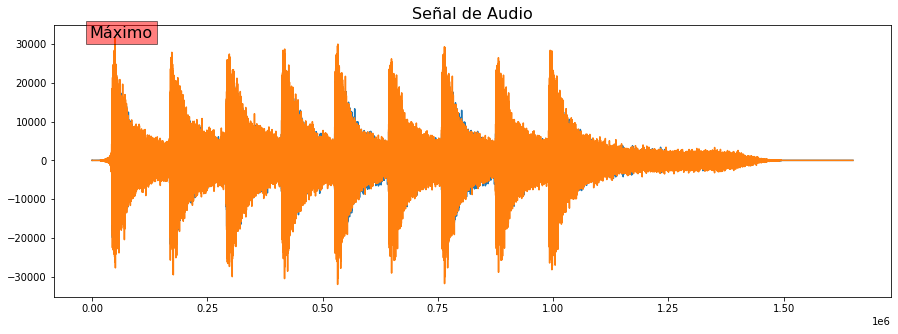

In [ ]:
# Definir tamaño de la figura
plt.rcParams['figure.figsize'] = (15, 5)

# Gráficar la señal
plt.plot(Audiodata)
plt.text(0-5000, np.max(Audiodata), 'Máximo', fontsize = 16, bbox=dict(facecolor='red', alpha=0.5))
plt.title('Señal de Audio',size=16);

Pero, las señales de audio se representan con la amplitud entre -1 y 1 , y el eje Horizontal en tiempo

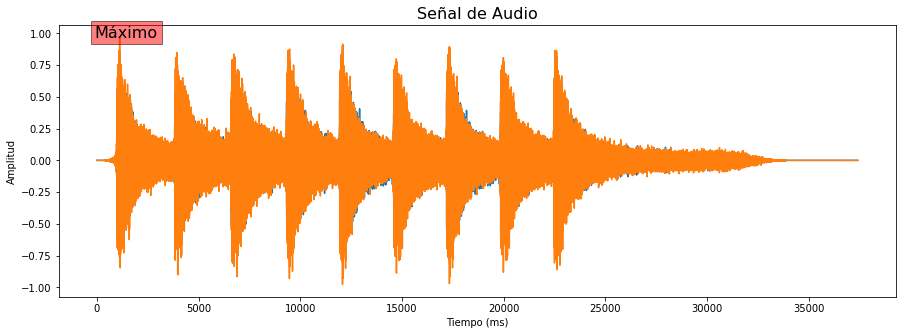

In [ ]:
# Definir tamaño de la figura
plt.rcParams['figure.figsize'] = (15, 5)

# Definir los valores de los datos de amplitud entre [-1 : 1]
AudiodataScaled = Audiodata/(2**15)

#definir los valores del eje x en milisegundos
timeValues = np.arange(0, len(AudiodataScaled), 1)/ fs # Convertir Muestras/Seg a Segundos
timeValues = timeValues * 1000  #Escala de tiempo en milisegundos

# Gráficar la señal
plt.plot(timeValues, AudiodataScaled)
plt.title('Señal de Audio',size=16)
plt.text(0-100, np.max(AudiodataScaled), 'Máximo', fontsize = 16,bbox=dict(facecolor='red', alpha=0.5))
plt.ylabel('Amplitud')
plt.xlabel('Tiempo (ms)');

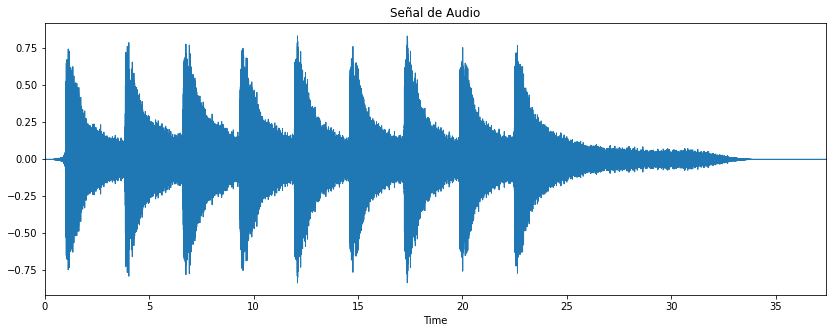

In [ ]:
import librosa.display
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)
plt.title('Señal de Audio');

## **Extracción de características**

Puedes tomar ejemplos de audio en el enlace: https://www.fesliyanstudios.com/royalty-free-sound-effects-download/tom-tom-drums-275

In [ ]:
# Importar librerias
from pathlib import Path
import pandas as pd

In [ ]:
# Leer archivos de audio
TT_Drums_signals = [librosa.load(p)[0] for p in Path().glob('Tom-Drum-*.mp3')]

In [ ]:
# Visualizar arrays
TT_Drums_signals

[array([-1.1502876e-07,  1.2029213e-07, -1.2152356e-07, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00], dtype=float32),
 array([ 1.09604706e-07, -1.23149533e-07,  1.34768683e-07, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00], dtype=float32)]

In [ ]:
# Tipo de dato de la señal
TT_Drums_signals[0].dtype

dtype('float32')

In [ ]:
#Cantidad de audios
len(TT_Drums_signals)

2

In [ ]:
# Escuchar audio 1
ipd.Audio('/content/Tom-Drum-Medium-Hit-Level-2A-www.fesliyanstudios.com.mp3')

In [ ]:
# Escuchar audio 2
ipd.Audio('/content/Tom-Drum-Floor-Hit-Level-5A-www.fesliyanstudios.com.mp3')

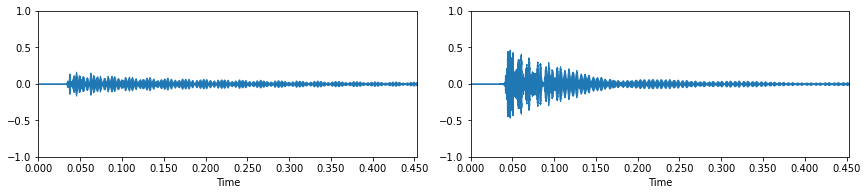

In [ ]:
# Definir tamaño de la figura
plt.figure(figsize=(30, 5))

# Graficar señal de audio
for i, x in enumerate(TT_Drums_signals):
    plt.subplot(2, 5, i+1)
    librosa.display.waveplot(x[:10000])
    plt.ylim(-1, 1)
    plt.tight_layout()

Contruir vector de características para determinar el número de cruces por cero y el centroide del espectro

In [ ]:
def extract_features(signal):
    return [
        librosa.feature.zero_crossing_rate(signal)[0, 0],
        librosa.feature.spectral_centroid(signal)[0, 0],
    ]

In [ ]:
# Extraer características
TT_Drums_features = np.array([extract_features(x) for x in TT_Drums_signals])

In [ ]:
# Visualizar las características
TT_Drums_features

array([[1.94335938e-01, 1.08363821e+03],
       [2.25585938e-01, 2.05708404e+03]])

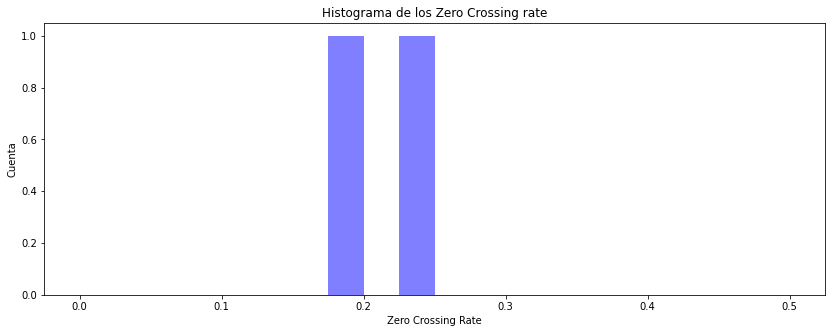

In [ ]:
# Defnir tamaño de la figura
plt.figure(figsize=(14, 5))

# Gráficar tasa de cruces por cero
plt.hist(TT_Drums_features[:,0], color='b', range=(0, 0.5), alpha=0.5, bins=20)
plt.title('Histograma de los Zero Crossing rate')
plt.xlabel('Zero Crossing Rate')
plt.ylabel('Cuenta');

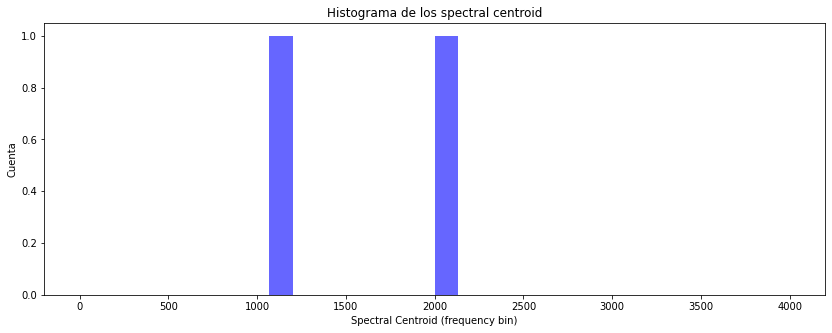

In [ ]:
# Defnir tamaño de la figura
plt.figure(figsize=(14, 5))

# Gráficar centroide espectral
plt.hist(TT_Drums_features[:,1], color='b', range=(0, 4000), bins=30, alpha=0.6)
plt.title('Histograma de los spectral centroid')
plt.xlabel('Spectral Centroid (frequency bin)')
plt.ylabel('Cuenta');

## **Extracción de características Librería Essentia**

Librería de código abierto con herramientas para análisis de audio y musica, descripción y síntesis. 

Más información en https://essentia.upf.edu

In [ ]:
# Instalar librería
! pip install essentia

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 13.6 MB 5.5 MB/s 


In [ ]:
# Importar librerías
import essentia
import essentia.standard

In [ ]:
# Métodos de essentia.standard
dir(essentia.standard)

['AfterMaxToBeforeMaxEnergyRatio',
 'AllPass',
 'AudioLoader',
 'AudioOnsetsMarker',
 'AudioWriter',
 'AutoCorrelation',
 'BFCC',
 'BPF',
 'BandPass',
 'BandReject',
 'BarkBands',
 'BeatTrackerDegara',
 'BeatTrackerMultiFeature',
 'Beatogram',
 'BeatsLoudness',
 'BinaryOperator',
 'BinaryOperatorStream',
 'BpmHistogram',
 'BpmHistogramDescriptors',
 'BpmRubato',
 'CartesianToPolar',
 'CentralMoments',
 'Centroid',
 'ChordsDescriptors',
 'ChordsDetection',
 'ChordsDetectionBeats',
 'ChromaCrossSimilarity',
 'Chromagram',
 'Chromaprinter',
 'ClickDetector',
 'Clipper',
 'ConstantQ',
 'CoverSongSimilarity',
 'Crest',
 'CrossCorrelation',
 'CrossSimilarityMatrix',
 'CubicSpline',
 'DCRemoval',
 'DCT',
 'Danceability',
 'Decrease',
 'Derivative',
 'DerivativeSFX',
 'DiscontinuityDetector',
 'Dissonance',
 'DistributionShape',
 'Duration',
 'DynamicComplexity',
 'ERBBands',
 'EasyLoader',
 'EffectiveDuration',
 'Energy',
 'EnergyBand',
 'EnergyBandRatio',
 'Entropy',
 'Envelope',
 'EqloudLoa

In [ ]:
# Leer audio
loader = essentia.standard.MonoLoader(filename='/content/Canada-Ramzoid.wav')
audio = loader()

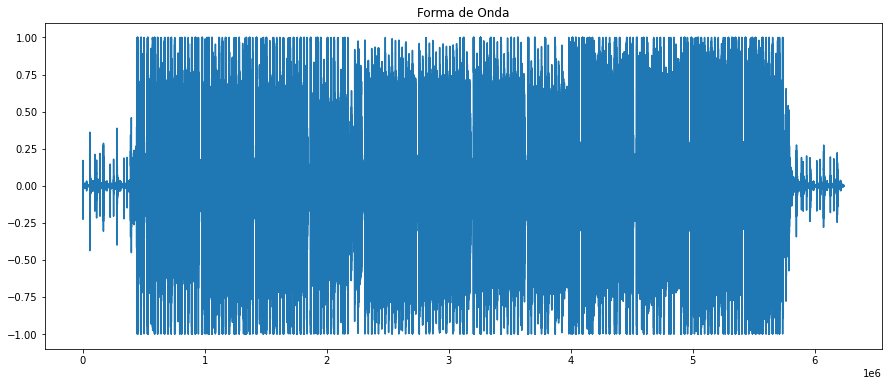

In [ ]:
# Definir tamaño de la figura
plt.rcParams['figure.figsize'] = (15, 6)

# Graficar la señal
plt.plot(audio)
plt.title("Forma de Onda");

Usaremos las características que se pueden extraer con essentia_streaming_extractor_music

Ver todas en https://essentia.upf.edu/streaming_extractor_music.html

In [ ]:
# Descargar archivos
!wget "https://essentia.upf.edu/documentation/extractors/essentia-extractors-v2.1_beta2-linux-x86_64.tar.gz"

# Descomprimir archivos
!tar -xvf essentia-extractors-v2.1_beta2-linux-x86_64.tar.gz

# Ejecutar y extraer las características en un archivo json
!./essentia-extractors-v2.1_beta2/streaming_extractor_music ./Canada-Ramzoid.wav features_essentia.json

--2022-06-27 23:19:27--  https://essentia.upf.edu/documentation/extractors/essentia-extractors-v2.1_beta2-linux-x86_64.tar.gz
Resolving essentia.upf.edu (essentia.upf.edu)... 84.89.139.43
Connecting to essentia.upf.edu (essentia.upf.edu)|84.89.139.43|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://essentia.upf.edu/extractors/essentia-extractors-v2.1_beta2-linux-x86_64.tar.gz [following]
--2022-06-27 23:19:28--  https://essentia.upf.edu/extractors/essentia-extractors-v2.1_beta2-linux-x86_64.tar.gz
Reusing existing connection to essentia.upf.edu:443.
HTTP request sent, awaiting response... 200 OK
Length: 135125725 (129M) [application/octet-stream]
Saving to: ‘essentia-extractors-v2.1_beta2-linux-x86_64.tar.gz’

essentia-extractors 100%[===================>] 128.87M   915KB/s    in 1m 45s  

2022-06-27 23:21:12 (1.23 MB/s) - ‘essentia-extractors-v2.1_beta2-linux-x86_64.tar.gz’ saved [135125725/135125725]

essentia-extractors-v2.1_beta2/
essentia-extr

In [ ]:
# Leer archivo con las características
df_audio = pd.read_json('features_essentia.json')
df_audio.head()

,lowlevel,metadata,rhythm,tonal
average_loudness,0.941563,NaN,NaN,NaN
barkbands_crest,"{'dmean': 1.32773900032, 'dmean2': 2.039071321...",NaN,NaN,NaN
barkbands_flatness_db,"{'dmean': 0.0204218514264, 'dmean2': 0.0292322...",NaN,NaN,NaN
barkbands_kurtosis,"{'dmean': 15.7355766296, 'dmean2': 23.82083129...",NaN,NaN,NaN
barkbands_skewness,"{'dmean': 1.00015842915, 'dmean2': 1.477839112...",NaN,NaN,NaN


In [ ]:
# Agregar nombre al índice
df_audio.index.name = 'features'
df_audio.head()

,lowlevel,metadata,rhythm,tonal
features,,,,
average_loudness,0.941563,NaN,NaN,NaN
barkbands_crest,"{'dmean': 1.32773900032, 'dmean2': 2.039071321...",NaN,NaN,NaN
barkbands_flatness_db,"{'dmean': 0.0204218514264, 'dmean2': 0.0292322...",NaN,NaN,NaN
barkbands_kurtosis,"{'dmean': 15.7355766296, 'dmean2': 23.82083129...",NaN,NaN,NaN
barkbands_skewness,"{'dmean': 1.00015842915, 'dmean2': 1.477839112...",NaN,NaN,NaN


In [ ]:
# Ver las características
df_audio.index

Index(['average_loudness', 'barkbands_crest', 'barkbands_flatness_db',
       'barkbands_kurtosis', 'barkbands_skewness', 'barkbands_spread',
       'dissonance', 'dynamic_complexity', 'erbbands_crest',
       'erbbands_flatness_db', 'erbbands_kurtosis', 'erbbands_skewness',
       'erbbands_spread', 'hfc', 'melbands_crest', 'melbands_flatness_db',
       'melbands_kurtosis', 'melbands_skewness', 'melbands_spread',
       'pitch_salience', 'silence_rate_20dB', 'silence_rate_30dB',
       'silence_rate_60dB', 'spectral_centroid', 'spectral_complexity',
       'spectral_decrease', 'spectral_energy', 'spectral_energyband_high',
       'spectral_energyband_low', 'spectral_energyband_middle_high',
       'spectral_energyband_middle_low', 'spectral_entropy', 'spectral_flux',
       'spectral_kurtosis', 'spectral_rms', 'spectral_rolloff',
       'spectral_skewness', 'spectral_spread', 'spectral_strongpeak',
       'zerocrossingrate', 'barkbands', 'erbbands', 'gfcc', 'melbands', 'mfcc',
      

In [ ]:
df_audio.loc['spectral_energy']['lowlevel']

{'dmean': 0.0131505075842,
 'dmean2': 0.0190047621727,
 'dvar': 0.00134525587782,
 'dvar2': 0.00221882923506,
 'max': 0.478844583035,
 'mean': 0.108759969473,
 'median': 0.11618068814299999,
 'min': 5.02957397952e-10,
 'var': 0.00621179258451}

# **Reconocimiento de voz**

In [ ]:
# Salida fs: Frecuencia de muestreo and data: Señal de audio -> int16
from scipy.io import wavfile 
AudioName = "pycon.wav" 
fs, Audiodata = wavfile.read(AudioName)
print(f'Duracion = {Audiodata.shape[0]/fs} , Frecuencia de Muestreo = {fs} [=] Muestras/Seg' \
      f', Wav format = {Audiodata.dtype}')

Duracion = 16.557833333333335 , Frecuencia de Muestreo = 48000 [=] Muestras/Seg, Wav format = int16


In [ ]:
ipd.Audio(AudioName)

In [ ]:
!pip install -q SpeechRecognition
import speech_recognition as sr
print( f'La version de speech recognition es: {sr.__version__}')

     |████████████████████████████████| 32.8 MB 46.6 MB/s 
La version de speech recognition es: 3.8.1


* recognize_bing(): Microsoft Bing Speech
* recognize_google(): Google Web Speech API
* recognize_google_cloud(): Google Cloud Speech - requiere instalar de google-cloud-speech package
* recognize_houndify(): Houndify by SoundHound
* recognize_ibm(): IBM Speech to Text
* recognize_sphinx(): CMU Sphinx - requiere instalar PocketSphinx
* recognize_wit(): Wit.ai


In [ ]:
#Nota de voz Valentina
r = sr.Recognizer()
text=[]
  
with sr.AudioFile(AudioName) as source:
    audio_text = r.record(source)
r.recognize_google(audio_text,language='es-CO' )   

'Hola a todos Bienvenidos a la charla de Crea tu propio audio y descubre su magia con Peyton somos Valentina ariza y Laura López vamos a estar viendo una cantidad de tema súper interesante y que el señor se lo pierdan'

In [ ]:
#Nota de voz Laura
AudioLau = "pycon_Lau.wav" 
fs, Audiodata = wavfile.read(AudioLau)
ipd.Audio(AudioLau)


In [ ]:
r = sr.Recognizer()
text=[]
with sr.AudioFile(AudioLau) as source:
    audio_text = r.record(source)
r.recognize_google(audio_text,language='es-CO' )  

'Hola a todos Bienvenidos a la charla Crea tu propio audio y descubre su magia compay son somos Valentín ariza y Laura López vamos a estar viendo la cantidad de temas súper interesantes así que no se lo pierda'

In [ ]:
!pip install gTTS
from gtts import gTTS
tts = gTTS(text="Muchas gracias por quedarse hasta el final, espero hayan aprendido mucho", lang='es',    )
tts.save("DS_es.mp3")# grabar la traduccion en un archivo mp3
ipd.Audio('DS_es.mp3') # escuchar el archivo creado

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
